# Notation Clustering

In [16]:
from cv2 import kmeans
from dataclasses import dataclass
import json
import numpy as np
import os
import pickle
import random
import torch
import torchvision.transforms as transforms

if not os.path.exists("./KuiSCIMA"):
    !git clone https://github.com/SuziAI/KuiSCIMA.git
if not os.path.exists("./gui-tools"):
    !git clone https://github.com/SuziAI/gui-tools.git

from data_extraction import *
from image_manipulation import *

BATCH_SIZE = 100

def open_dataset(path_to_folder):
    path_to_json = os.path.join(path_to_folder, "dataset.json")
    with open(path_to_json) as file:
        dataset_json = json.load(file)
        
        for idx in range(len(dataset_json)):
            dataset_json[idx]["image"] = cv2.imread(os.path.join(path_to_folder, dataset_json[idx]["image_path"]), cv2.IMREAD_GRAYSCALE)
            dataset_json[idx]["annotation"] = dataset_json[idx]["annotation"]
            dataset_json[idx]["image_id"] = dataset_json[idx]["image_path"].split("_")[0] + "_" + dataset_json[idx]["image_path"].split("_")[1] + "_" + dataset_json[idx]["image_path"].split("_")[2]
    return dataset_json

In [6]:
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    shrink(is_random=False, target_size=18),
    paste_to_square(is_random=False, target_size=20),
    lambda img: transforms.functional.invert(img), # inverts image, needed for rotations
])

display_transforms = transforms.Compose([
    transforms.ToTensor(),
    shrink(is_random=False, target_size=50),
    paste_to_square(is_random=False, target_size=55),
    lambda img: transforms.functional.invert(img), # inverts image, needed for rotations
])

In [10]:
dataset = open_dataset("./TotalDataset/Music/")

[ WARN:0@1185.527] global loadsave.cpp:248 findDecoder imread_('./TotalDataset/Music/images/zhu_edition_055_059_nishangzhongxu_187.png'): can't open/read file: check file path/integrity


In [11]:
print(dataset[0])

{'image_path': 'images/lu_edition_042_015_guyuan_5.png', 'type': 'Music', 'notation_type': 'Jianzipu', 'annotation': {'type': 'FULL_JIANZIPU', 'content': {'content': '⿱', 'children': [{'content': '⿰', 'children': [{'content': 'LEFT_FINGER_DA'}, {'content': 9}]}, {'content': '⿺', 'children': [{'content': 'RIGHT_TIAO'}, {'content': 7}]}]}}, 'edition': 'lu', 'filename': '015_guyuan.json', 'text_annotation': '日', 'image': array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ...,   0, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8), 'image_id': 'images/lu_edition_042'}


In [14]:
all_images_dict = {}
all_images_dict["Jianzipu"] = []
all_images_dict["Lvlvpu"] = []
all_images_dict["Suzipu"] = []

curated_dict = {}
curated_dict["Jianzipu"] = {}
curated_dict["Lvlvpu"] = {}
curated_dict["Suzipu"] = {}

for entry in dataset:
    annotation_str = str(entry["annotation"])

    if annotation_str is None or annotation_str == "None":
        continue
    if entry["notation_type"] == "Lvlvpu" and "None" in annotation_str:
        continue
    if entry["notation_type"] == "Suzipu" and "{'pitch': None, 'secondary': None}" in annotation_str:
        continue
    if entry["notation_type"] == "Jianzipu" and "''" in annotation_str:
        continue

    entry["square_image"] = test_transforms(entry["image"])[0].numpy()
    entry["display_image"] = display_transforms(entry["image"])[0].numpy()
        
    if annotation_str not in curated_dict[entry["notation_type"]]:
        curated_dict[entry["notation_type"]][annotation_str] = []
        
    curated_dict[entry["notation_type"]][annotation_str].append(entry)
    all_images_dict[entry["notation_type"]].append(entry)

In [18]:
large_classes = []
k = "Suzipu"
maxi = 0
num = 0
for cl in list(curated_dict[k].keys()):
    element = curated_dict[k][cl]
    if len(element) > 4*5:
        large_classes.append(cl)
        print(len(element))
        maxi = max(maxi, len(element))
        num += 1

print(large_classes)

48
823
841
93
419
575
49
191
629
604
147
333
141
42
22
37
520
135
99
40
31
29
111
86
57
95
136
50
77
62
60
76
39
37
43
33
44
49
24
26
["{'pitch': 'SHANG', 'secondary': 'XIAO_ZHU'}", "{'pitch': 'GONG', 'secondary': None}", "{'pitch': 'CHE', 'secondary': None}", "{'pitch': 'SHANG', 'secondary': 'DING_ZHU'}", "{'pitch': 'HE', 'secondary': None}", "{'pitch': 'YI', 'secondary': None}", "{'pitch': 'LIU', 'secondary': 'XIAO_ZHU'}", "{'pitch': 'WU', 'secondary': None}", "{'pitch': 'SHANG', 'secondary': None}", "{'pitch': 'LIU', 'secondary': None}", "{'pitch': 'YI', 'secondary': 'ZHE'}", "{'pitch': 'SI', 'secondary': None}", "{'pitch': 'FAN', 'secondary': 'ZHE'}", "{'pitch': 'HE', 'secondary': 'DING_ZHU'}", "{'pitch': 'WU', 'secondary': 'DING_ZHU'}", "{'pitch': 'CHE', 'secondary': 'XIAO_ZHU'}", "{'pitch': 'FAN', 'secondary': None}", "{'pitch': 'GOU', 'secondary': None}", "{'pitch': 'CHE', 'secondary': 'DING_ZHU'}", "{'pitch': 'YI', 'secondary': 'XIAO_ZHU'}", "{'pitch': 'FAN', 'secondary': 'XIAO

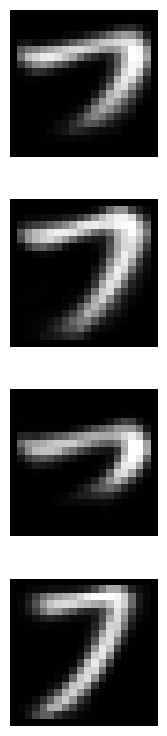

In [19]:
num_clusters = 4

from sklearn.cluster import KMeans
#for large_class in large_classes:
    #print(large_class)

large_class = large_classes[1]

training_data = []
for element in curated_dict["Suzipu"][large_class]:
    reshaped = element["square_image"].reshape(400)
    training_data.append(reshaped)

clustering = KMeans(num_clusters).fit(training_data)

############################
image_means = {}
for label in range(num_clusters):
    image_means[label] = []
    
for data, label in zip(curated_dict["Suzipu"][large_class], clustering.labels_):
    image_means[label].append(data["square_image"])

for label in range(num_clusters):
    image_means[label] = np.mean(image_means[label], axis=0)

###############################

cols = 1
rows = num_clusters
figure = plt.figure(figsize=(2.2*cols, 2*rows))


for i in range(0, cols * rows):
    img = image_means[i]
    figure.add_subplot(rows, cols, i+1)
        
    figure.tight_layout()

    plt.axis("off")
    plt.imshow(img.squeeze(), cmap="gray")


plt.show()

In [20]:
from sklearn.cluster import KMeans
def select_subset(samples):
    if len(samples) <= 39:
        return samples, range(len(samples)), samples, [sample["square_image"] for sample in samples]
    else:
        num_clusters = 39
    
        training_data = []
        for element in samples:
            reshaped = element["square_image"].reshape(400)
            training_data.append(reshaped)
        
        clustering = KMeans(num_clusters, random_state=42).fit(training_data)
        ###########################
        selection = {}
        image_means = {}
        for label in range(num_clusters):
            image_means[label] = []
            selection[label] = []
            
        for data, label in zip(samples, clustering.labels_):
            selection[label].append(data)
            image_means[label].append(data["square_image"])
        
        for label in range(num_clusters):
            selection[label] = selection[label][0]
            image_means[label] = np.mean(image_means[label], axis=0)
        
        return samples, clustering.labels_, list(selection.values()), list(image_means.values())


In [21]:
import copy
display_dict = copy.deepcopy(curated_dict)

for notation in curated_dict.keys():
    for annotation_class in curated_dict[notation].keys():
        original_list, clusters, class_selection, class_means = select_subset(curated_dict[notation][annotation_class])
        
        display_dict[notation][annotation_class] = {}
        display_dict[notation][annotation_class]["original_list"] = original_list
        display_dict[notation][annotation_class]["clusters"] = clusters
        display_dict[notation][annotation_class]["class_selection"] = class_selection
        display_dict[notation][annotation_class]["class_means"] = class_means

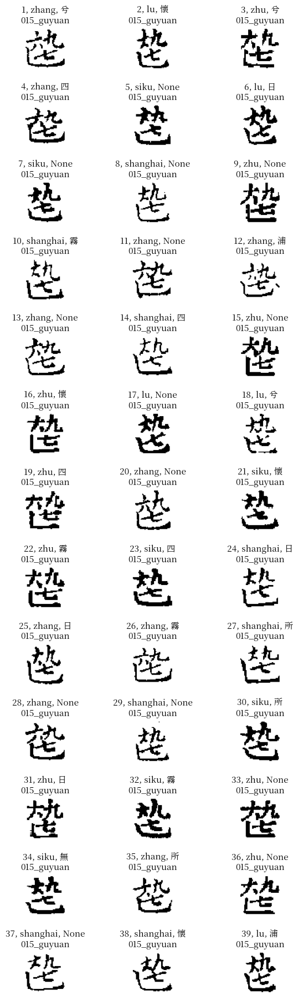

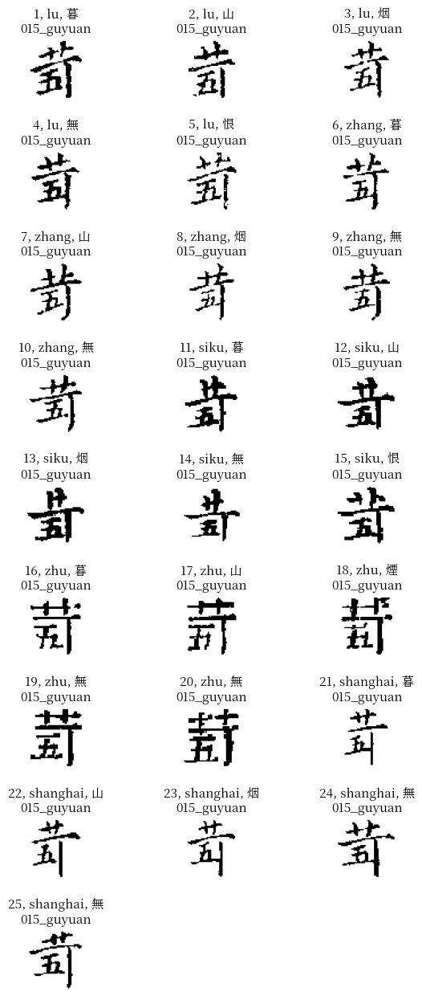

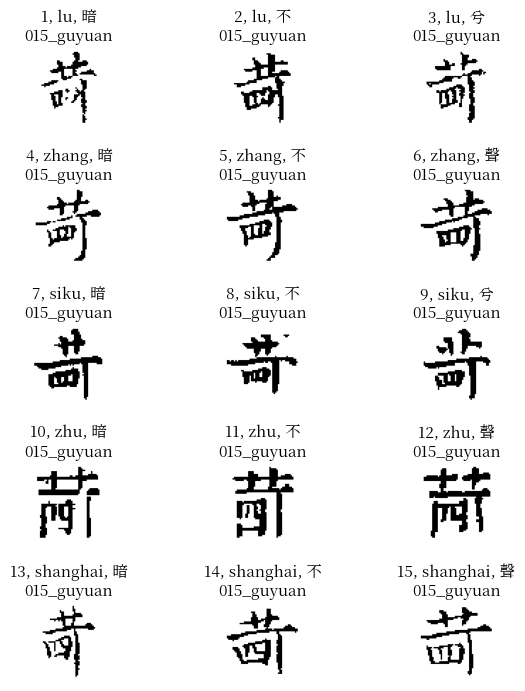

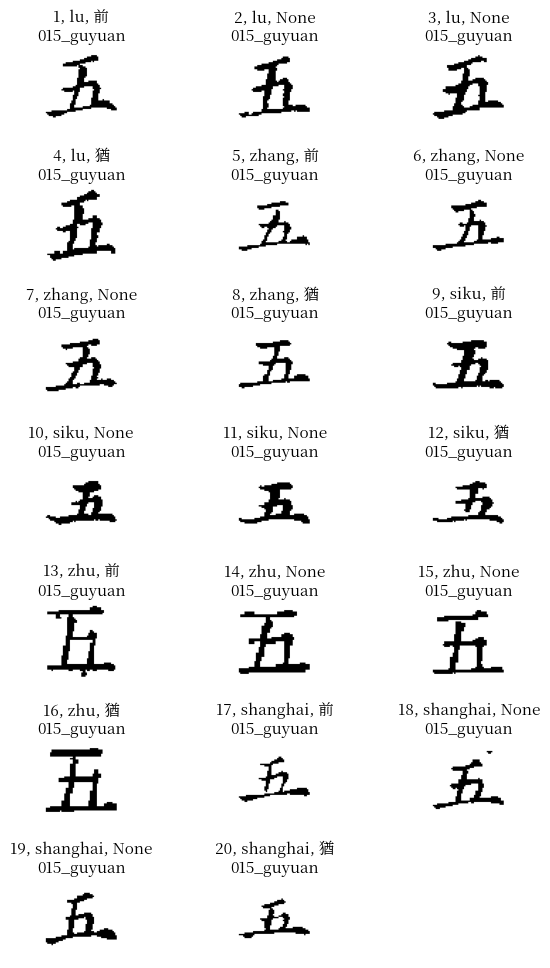

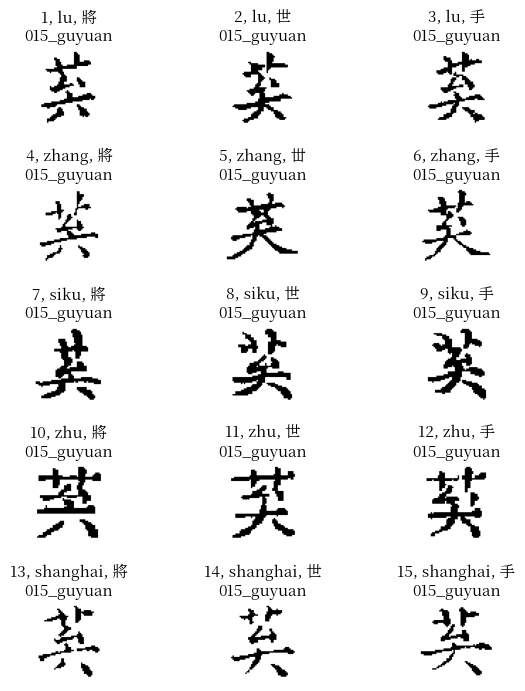

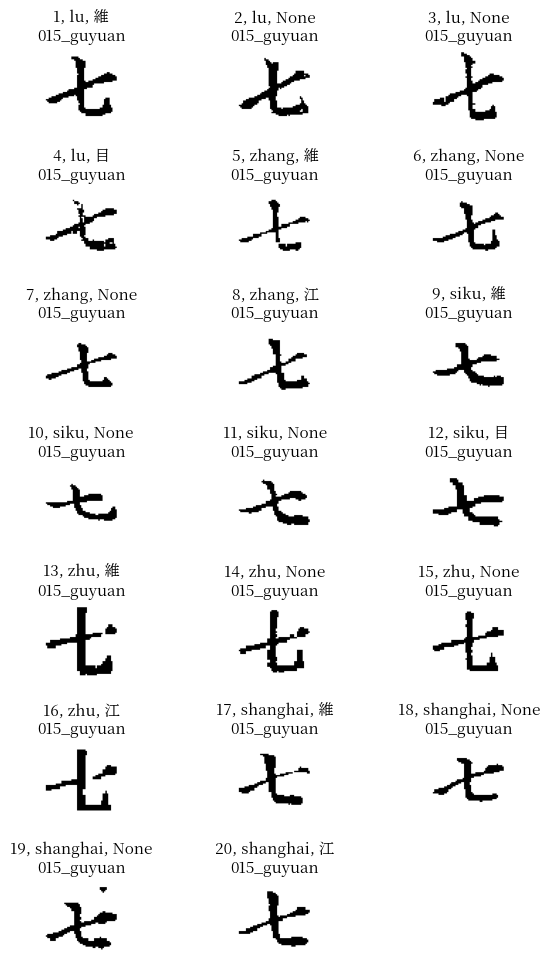

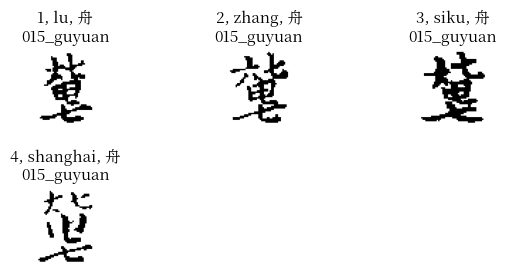

/tmp/ipykernel_33773/3264640764.py:72: UserWarning: Glyph 132355 (\N{CJK UNIFIED IDEOGRAPH-20503}) missing from font(s) Noto Serif CJK JP.
  plt.savefig(f"{clustering_dir}/{k}_{class_idx:03}_selection.png", dpi=90, bbox_inches='tight')


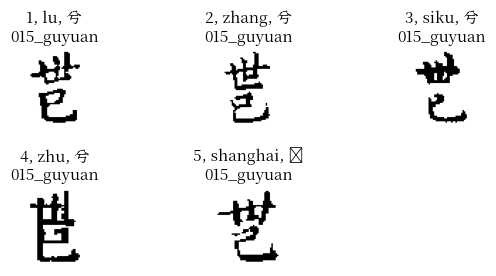

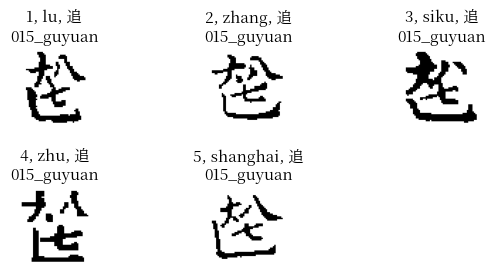

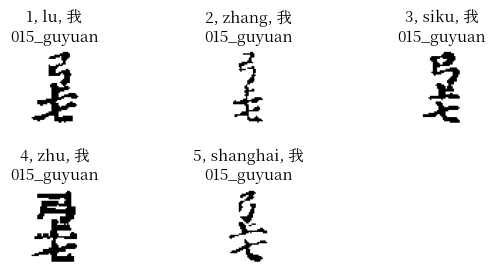

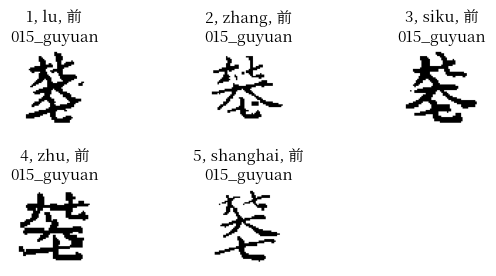

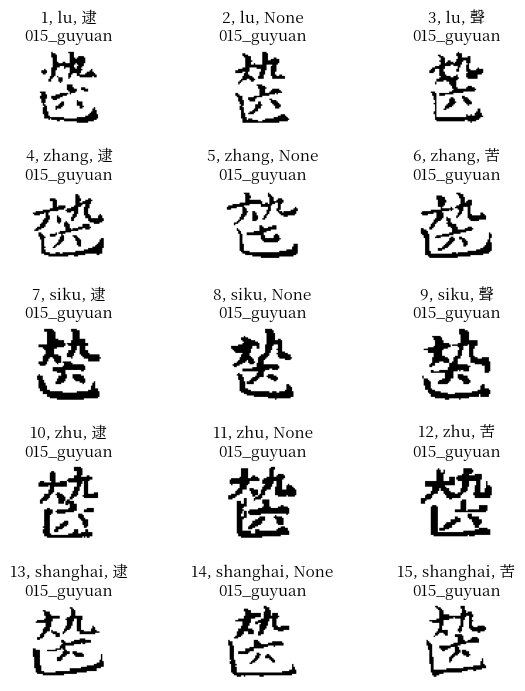

...

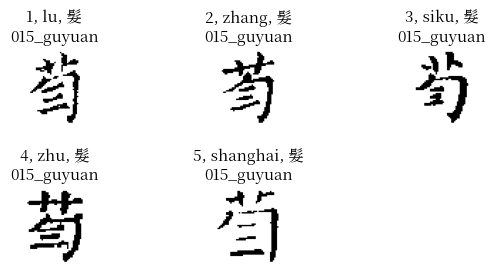

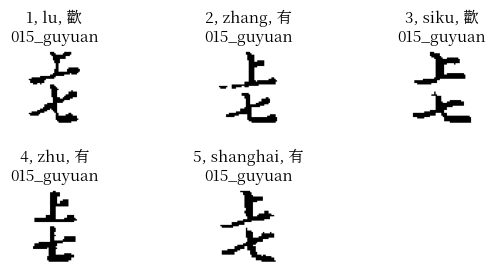

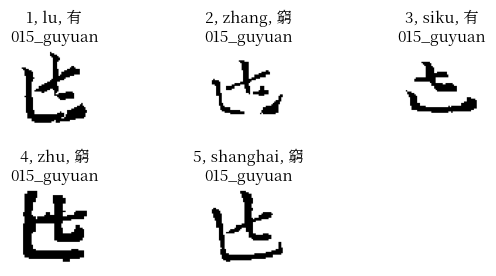

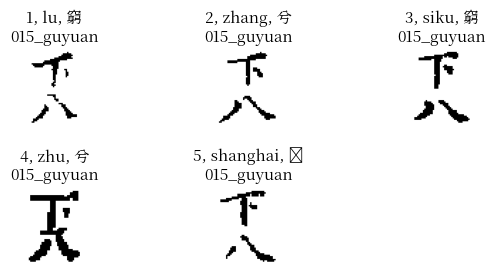

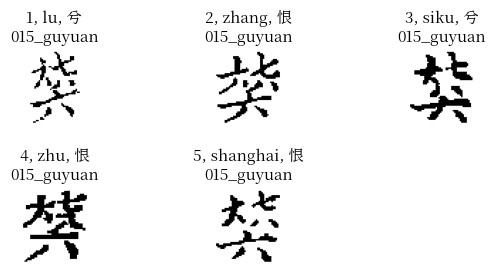

/tmp/ipykernel_33773/3264640764.py:72: UserWarning: Glyph 140218 (\N{CJK UNIFIED IDEOGRAPH-223BA}) missing from font(s) Noto Serif CJK JP.
  plt.savefig(f"{clustering_dir}/{k}_{class_idx:03}_selection.png", dpi=90, bbox_inches='tight')


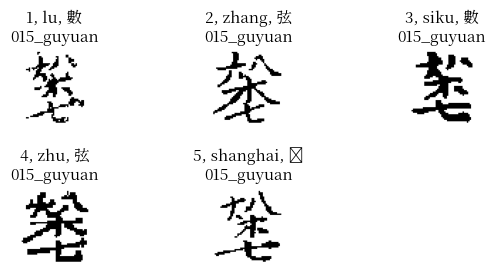

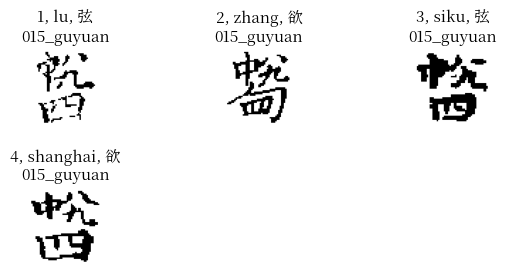

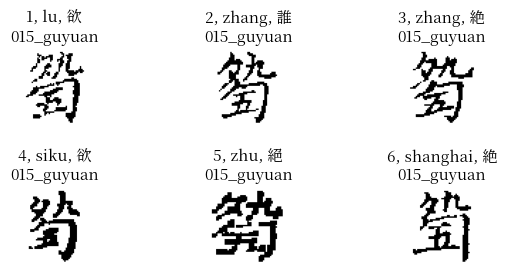

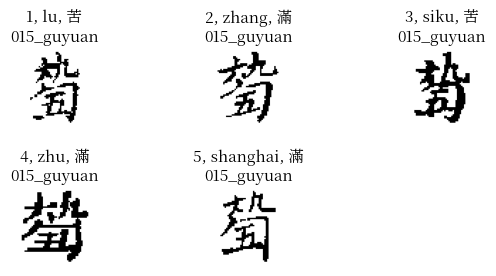

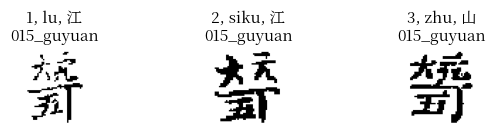

...

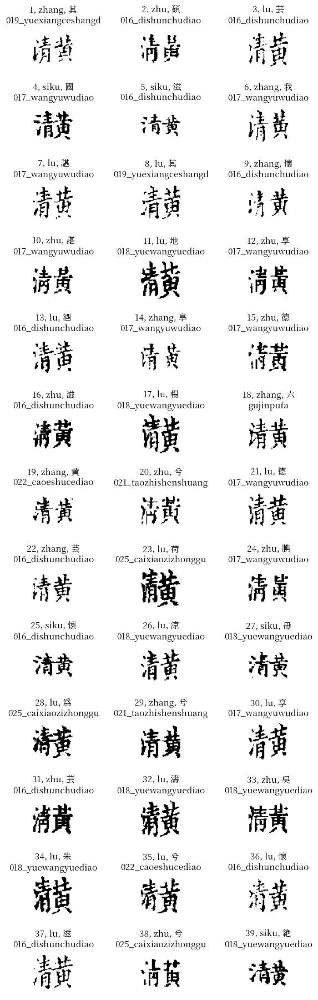

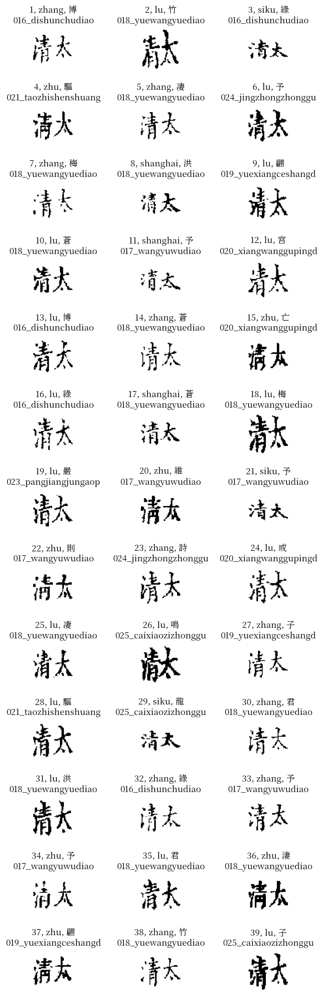

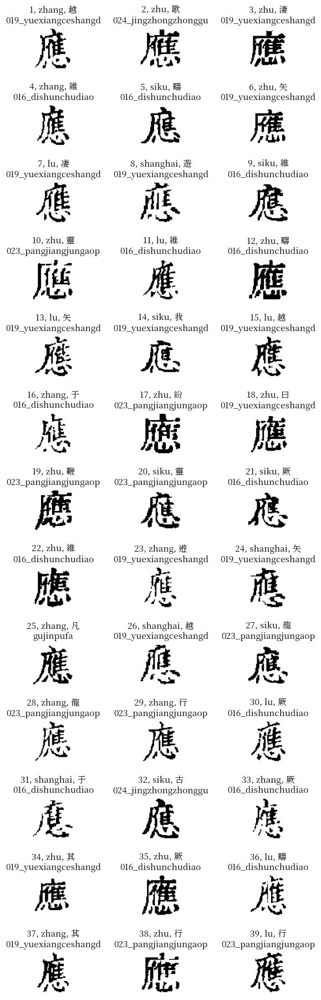

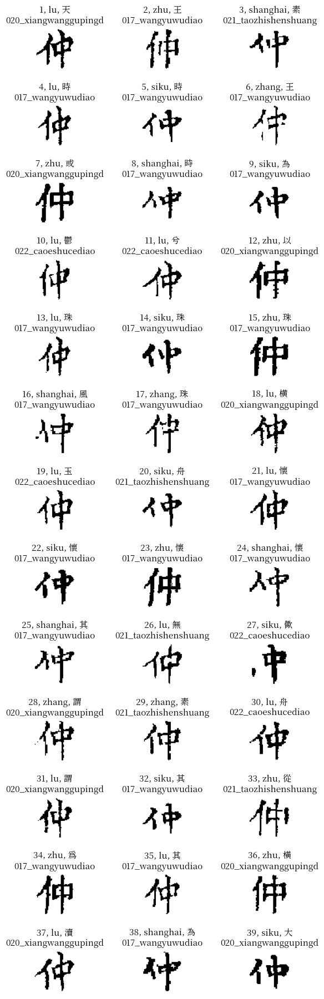

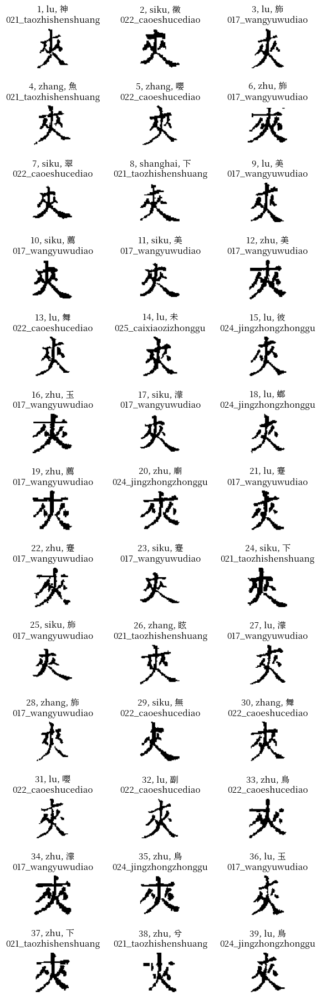

/tmp/ipykernel_33773/3264640764.py:72: UserWarning: Glyph 137421 (\N{CJK UNIFIED IDEOGRAPH-218CD}) missing from font(s) Noto Serif CJK JP.
  plt.savefig(f"{clustering_dir}/{k}_{class_idx:03}_selection.png", dpi=90, bbox_inches='tight')


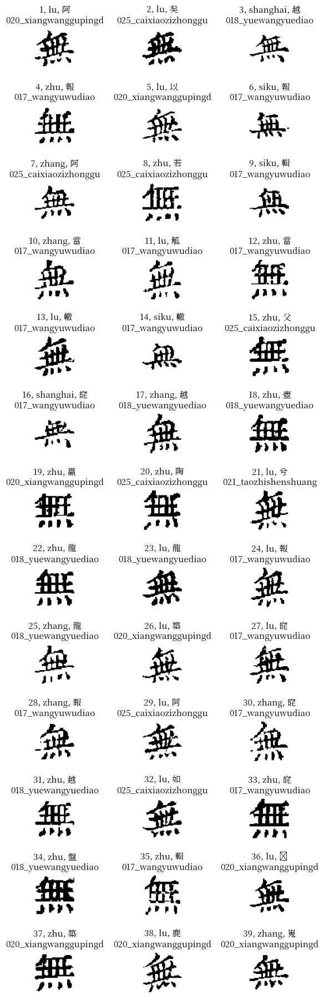

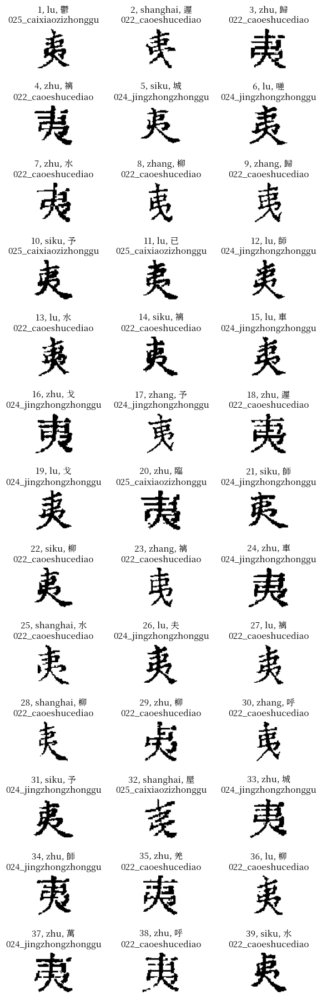

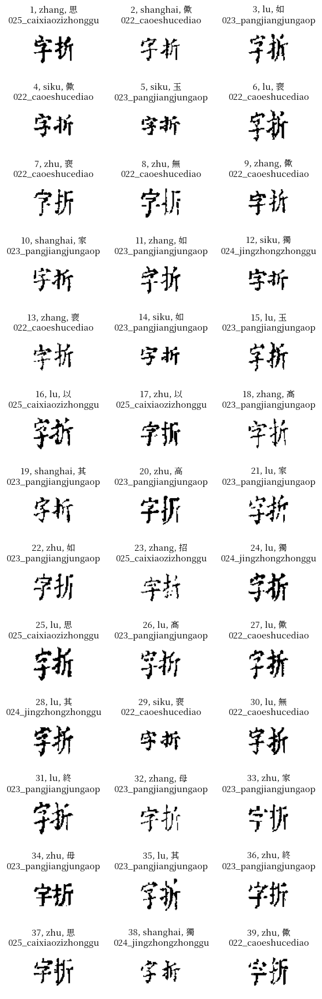

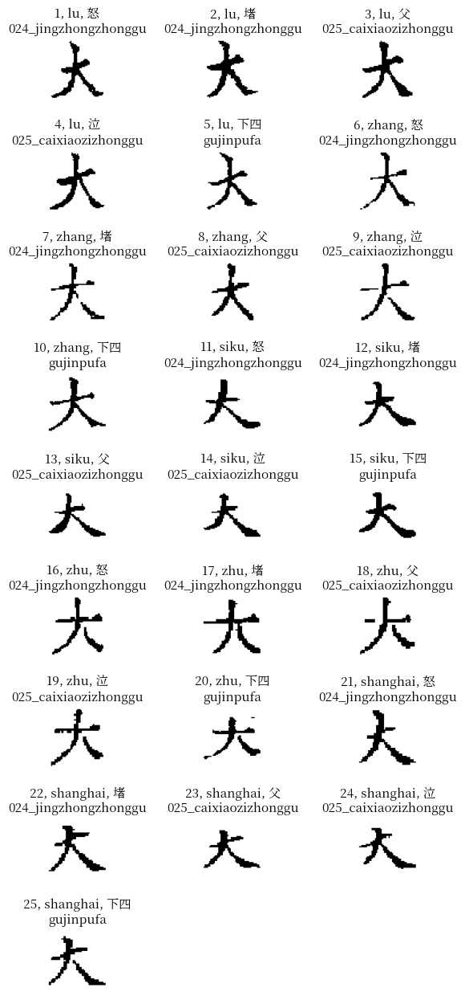

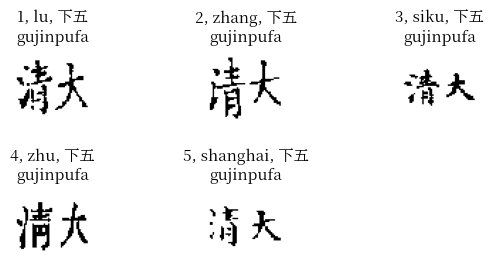

...

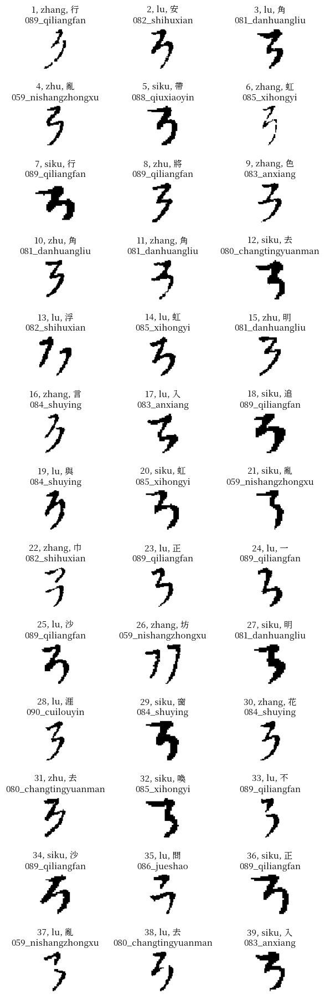

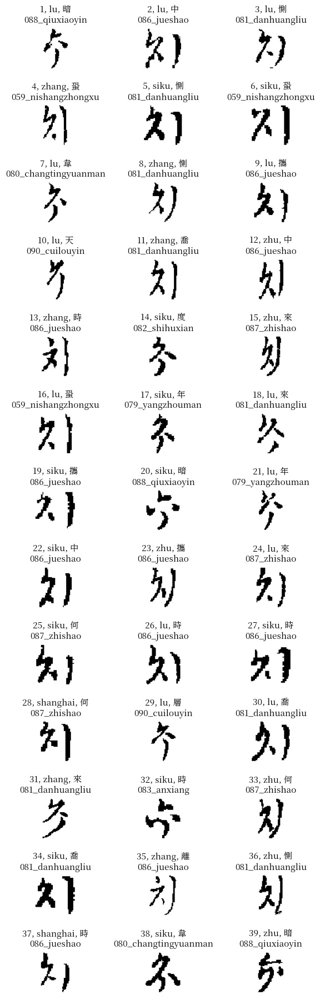

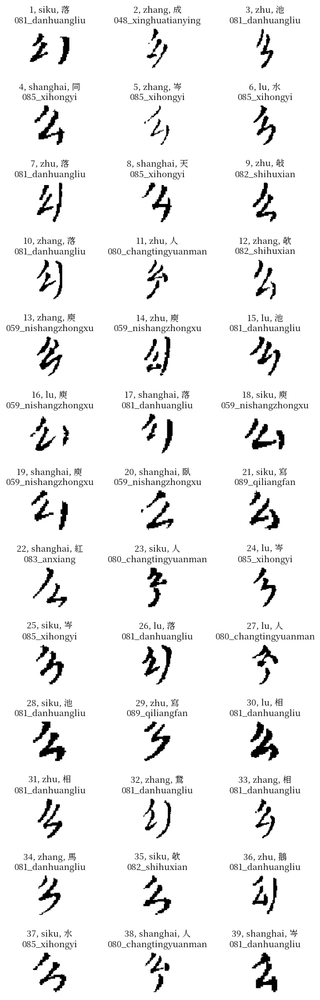

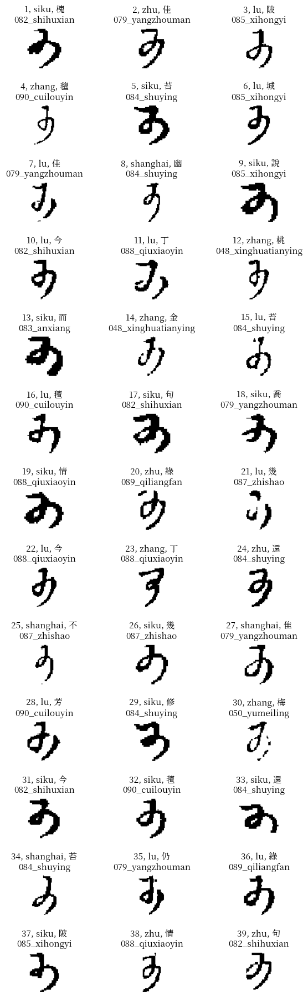

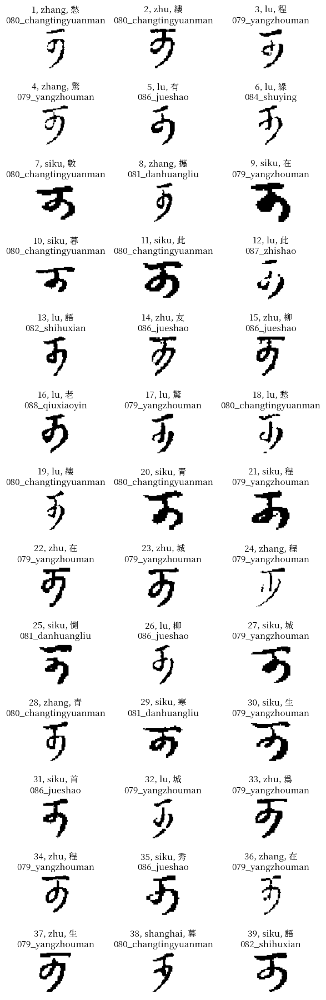

/tmp/ipykernel_33773/3264640764.py:72: UserWarning: Glyph 151646 (\N{CJK UNIFIED IDEOGRAPH-2505E}) missing from font(s) Noto Serif CJK JP.
  plt.savefig(f"{clustering_dir}/{k}_{class_idx:03}_selection.png", dpi=90, bbox_inches='tight')


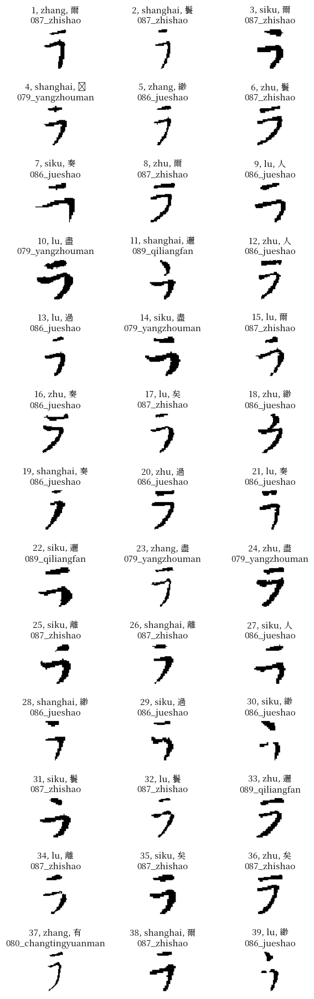

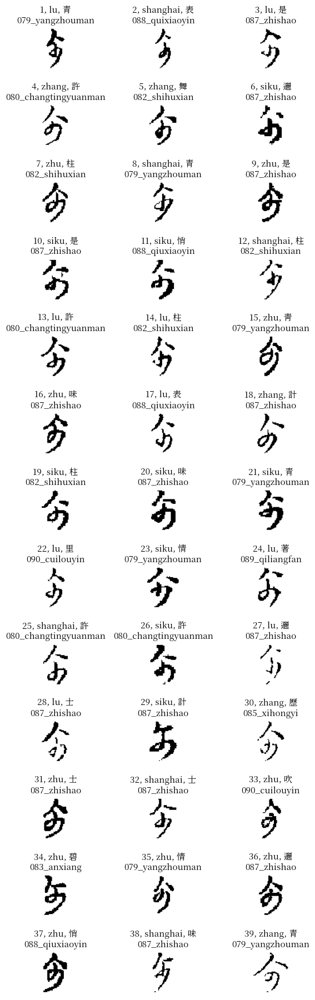

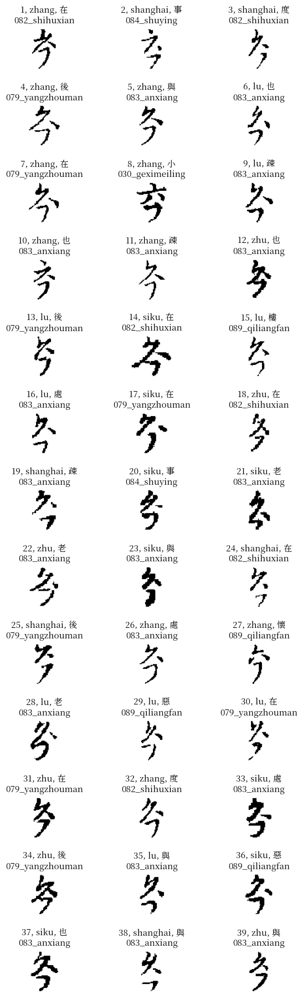

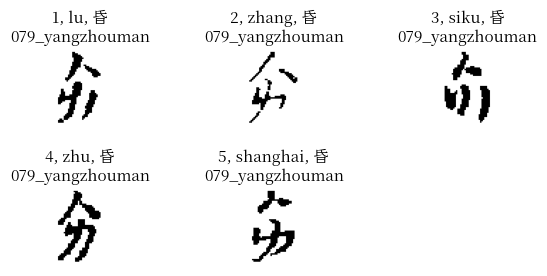

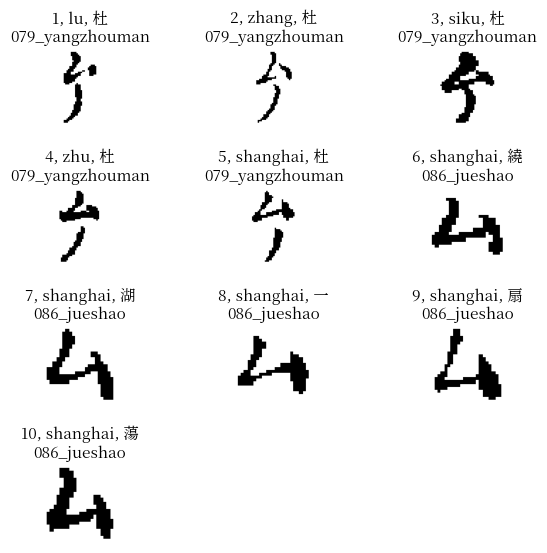

/tmp/ipykernel_33773/3264640764.py:72: UserWarning: Glyph 167572 (\N{CJK UNIFIED IDEOGRAPH-28E94}) missing from font(s) Noto Serif CJK JP.
  plt.savefig(f"{clustering_dir}/{k}_{class_idx:03}_selection.png", dpi=90, bbox_inches='tight')


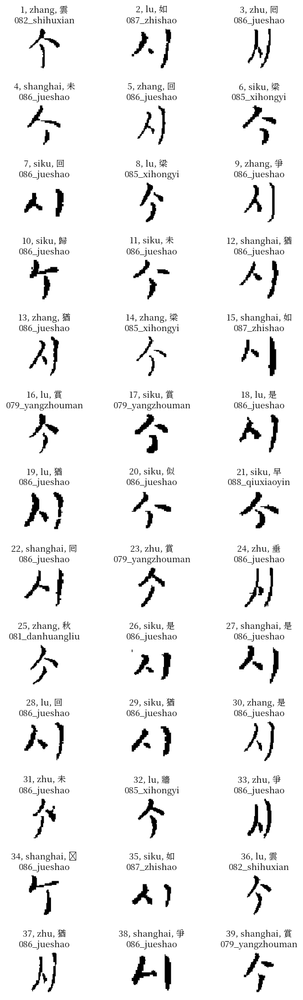

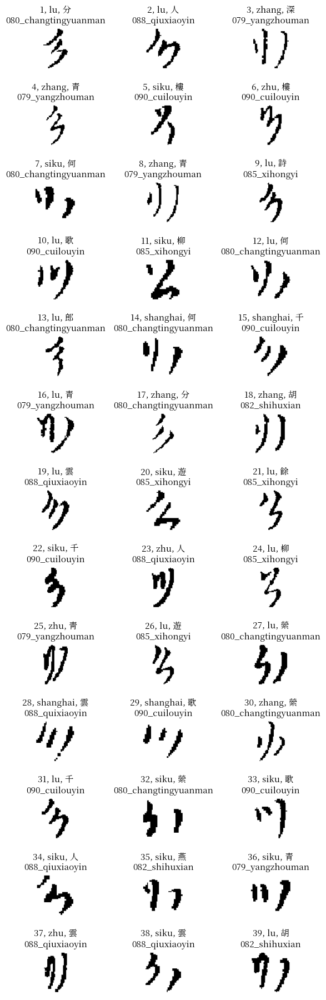

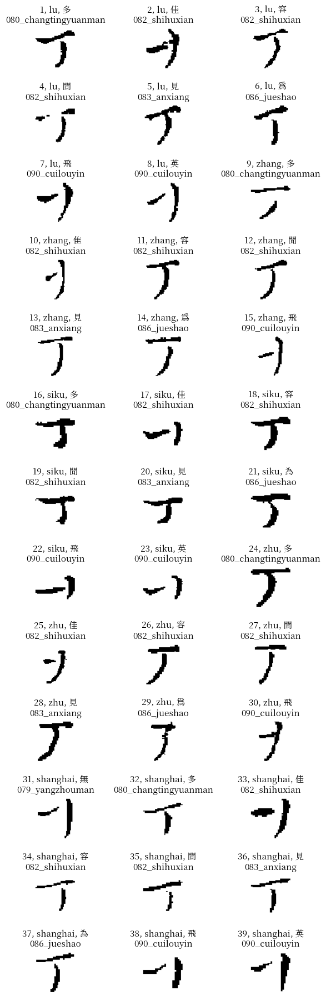

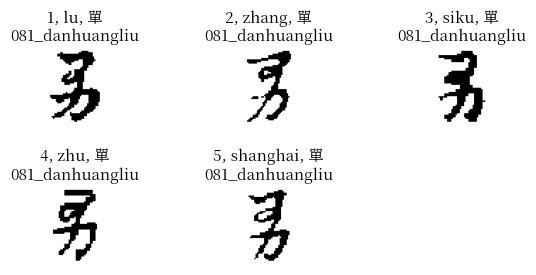

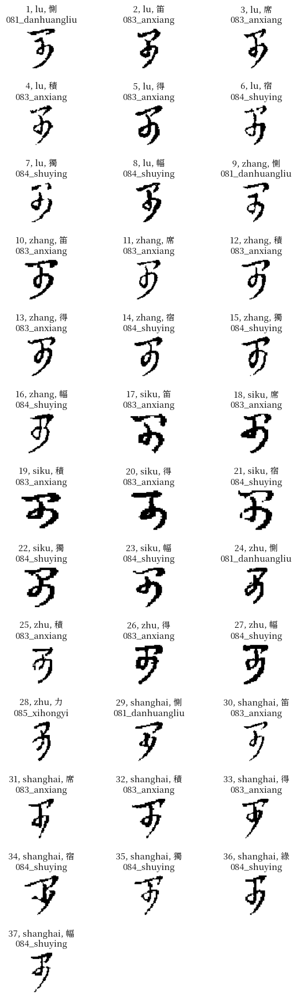

...

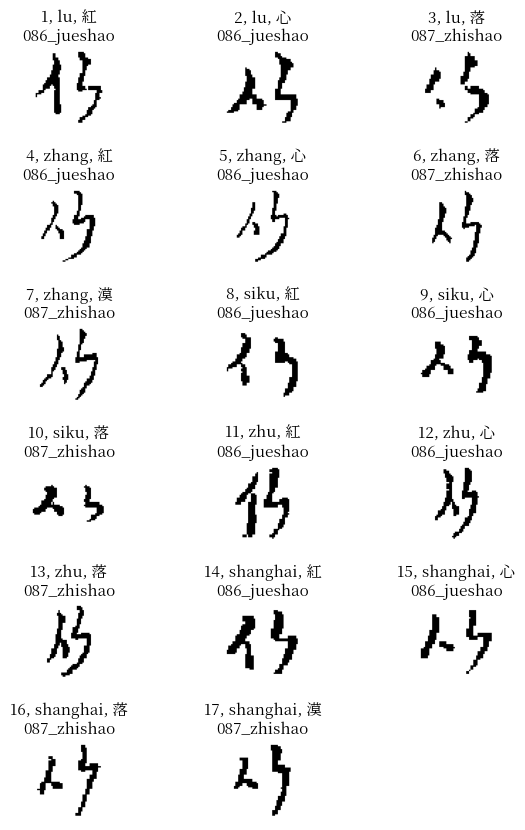

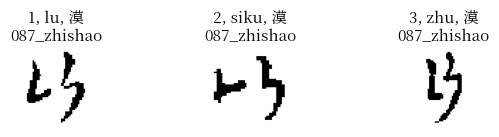

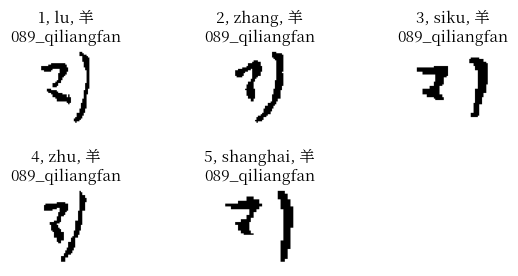

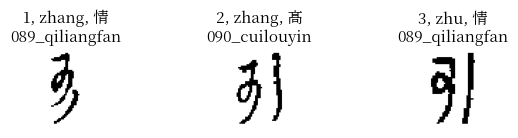

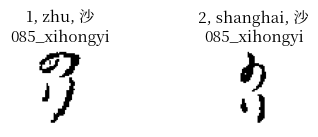

In [34]:
clustering_dir = "./clustering-files"
if not os.path.exists(clustering_dir):
    os.mkdir(clustering_dir)

from matplotlib import font_manager

fontP = font_manager.FontProperties()
fontP.set_family('Noto Serif CJK JP')
fontP.set_size(11)

#font_path = "./KuiSCIMA/eduSong_Unicode.ttf"
#fontP = font_manager.FontProperties(fname=font_path)
#fontP.set_family('AR PL KaitiM Big5')
#fontP.set_size(16)

if False:
    for class_idx, samples in enumerate(list(display_dict[k].values())):
        cols = 3
        rows = int(np.ceil(len(samples["class_means"])/cols))
        
        figure = plt.figure(figsize=(2.2*cols, 2*rows), constrained_layout=True)
        
        for sample_idx in range(0, cols * rows):
            if sample_idx >= len(samples["class_means"]):
                continue
    
            img = samples["class_means"][sample_idx]
            shortened_filename = samples["class_selection"][sample_idx]["filename"].split(".")[0]
            if len(shortened_filename) > 20:
                shortened_filename = shortened_filename[0:20]
            label = f'{sample_idx+1}, {samples["class_selection"][sample_idx]["edition"]}, {samples["class_selection"][sample_idx]["text_annotation"]}\n{shortened_filename}'
            figure.add_subplot(rows, cols, sample_idx+1)
                
            ttl = plt.title(label, fontproperties=fontP)
            plt.subplots_adjust(wspace=2, hspace=10)
            #figure.tight_layout()
            #ttl.set_y(1.05)
            #figure.subplots_adjust(top=0.8)
        
            plt.axis("off")
            plt.imshow(img.squeeze(), cmap="gray", aspect="equal")
            plt.savefig(f"./gui_files/{class_idx}_means.png")
            
for k in display_dict.keys():
    for class_idx, samples in enumerate(list(display_dict[k].values())):
        cols = 3
        rows = int(np.ceil(len(samples["class_selection"])/cols))
        
        #figure = plt.figure(figsize=(1.6*cols, 1.6*rows))
        figure = plt.figure(figsize=(2*cols, 1.8*rows))
        #figure = plt.figure()
        
        for sample_idx in range(0, cols * rows):
            if sample_idx >= len(samples["class_selection"]):
                continue
    
            img = 1-samples["class_selection"][sample_idx]["display_image"]
            shortened_filename = samples["class_selection"][sample_idx]["filename"].split(".")[0]
            if len(shortened_filename) > 20:
                shortened_filename = shortened_filename[0:20]
            label = f'{sample_idx+1}, {samples["class_selection"][sample_idx]["edition"]}, {samples["class_selection"][sample_idx]["text_annotation"]}\n{shortened_filename}'
            figure.add_subplot(rows, cols, sample_idx+1)
                
            ttl = plt.title(label, fontproperties=fontP)
            plt.subplots_adjust(wspace=1.5, hspace=0)
            #figure.tight_layout()
            #ttl.set_y(1.05)
            #figure.subplots_adjust(top=0.8)
        
            plt.axis("off")
            plt.imshow(img.squeeze(), cmap="gray", interpolation=None)
        plt.savefig(f"{clustering_dir}/{k}_{class_idx:03}_selection.png", dpi=90, bbox_inches='tight')
        plt.show()



In [35]:
image_files = os.listdir(clustering_dir)
image_files = sorted(image_files)

image_dict = {}
image_dict["Jianzipu"] = {}
image_dict["Lvlvpu"] = {}
image_dict["Suzipu"] = {}

def class_idx_to_class_name(k, class_idx):
    return list(display_dict[k].keys())[class_idx]
    
for file_name in image_files:
    k = file_name.split("_")[0]
    class_idx = int(file_name.split("_")[1])
    img = cv2.imread(os.path.join(clustering_dir, file_name), cv2.IMREAD_GRAYSCALE)
    image_dict[k][class_idx_to_class_name(k, class_idx)] = img

with open("suzi_lvlv_jianzi_references.pkl", "wb") as file_handle:
    pickle.dump(image_dict, file_handle)

for file_name in image_files:
    os.remove(os.path.join(clustering_dir, file_name))
os.rmdir(clustering_dir)

True

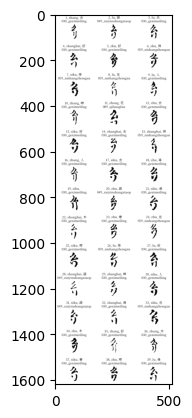

In [47]:
plt.imshow(image_dict["Suzipu"]["{'pitch': 'SHANG', 'secondary': 'XIAO_ZHU'}"], cmap="gray")
cv2.imwrite("clustering_suzipu.png", image_dict["Suzipu"]["{'pitch': 'CHE', 'secondary': 'YE'}"])
cv2.imwrite("clustering_lvlvpu.png", image_dict["Lvlvpu"]["{'pitch': 'HUANGZHONG_QING'}"])
cv2.imwrite("clustering_jianzipu.png", list(image_dict["Jianzipu"].values())[0])